# Figure 4 - Chewing and whole face kinematics analysis

The following notebook contains the code to reproduce Fig. 4a-f, h-k.
To run this notebook, you need the following Anipose projects:
- `omnibus-splitsession-20231031_B6-B20-B21-B26-B31-B32-B33_chew_rig2`

## Preliminaries

This imports the necessary packages and defines experimental variables.

In [1]:
%load_ext autoreload
%autoreload 2

# Update path as if notebook was run from top-level repo directory
import os
import sys
pwd = %pwd
if not pwd.endswith('mouse-fe-analysis'):
    sys.path.insert(0, os.path.abspath('..'))
    new_pwd = os.path.abspath(f"{pwd}/..")
    %cd {new_pwd}

/data/disk1/daruwal/repos/mouse-fe-analysis


/home/daruwal/micromamba/envs/mouse-fe-analysis/lib/python3.10/site-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [2]:
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
import kneed
from functools import partial

from fepipeline.anatomy import (compute_mouth_area,
                                compute_nose_bulge_volume,
                                compute_cheek_bulge_volume,
                                compute_ear_angle,
                                compute_proptosis,
                                compute_eye_orbital_tightness)
from fepipeline.features.landmarks import read_3d_data

from labutils.plotting import (sns_setup,
                               save_figure,
                               plot_data_grid,
                               plot_trialized_helper,
                               trim_3d_axes,
                               landmark_cmap,
                               measurements_cmap)
from labutils.utils import maybe

import warnings
warnings.filterwarnings("ignore", "is_categorical_dtype")
warnings.filterwarnings("ignore", "use_inf_as_na")

# set seaborn theme
sns_setup("paper", font="sans")
OUTPUT_DIR = "./figures/"
os.makedirs(OUTPUT_DIR, exist_ok=True)

# get cluster cmaps
LANDMARKS_CLUSTERS, LANDMARK_CMAP = landmark_cmap()
MEASUREMENT_CLUSTERS, MEASUREMENT_CMAP = measurements_cmap()

CONTROL_CMAP = sns.color_palette([sns.color_palette("colorblind")[2],
                                  sns.color_palette("colorblind")[-3],
                                  sns.color_palette("colorblind")[3]])

In [3]:
ANIPOSE_DIR = "./anipose-projects/omnibus-splitsession-20231031_B6-B20-B21-B26-B31-B32-B33_chew_rig2"
MICE = ["B6", "B20", "B21", "B26", "B31", "B32", "B33"]
#MICE = ['B20', 'B21'] #Define the mice you want to work with
BASE_DIRS = {mouse: f"20231031_B6-B20-B21-B26-B31-B32-B33_chew_rig2-{mouse}-bl-XXX"
             for mouse in MICE}
TEMP_DIRS = {mouse: f"20231031_B6-B20-B21-B26-B31-B32-B33_chew_rig2-{mouse}-temperature-XXX"
             for mouse in MICE}

Define start and end times of each trial (human labeled).

In [4]:
base_trials = {
    "B6": np.array([#np.arange(6750, 6750 + 3000),
                    np.arange(9971, 9971 + 3000),
                    np.arange(16338, 16338 + 3000),
                    np.arange(19516, 19516 + 3000),
                    np.arange(22709, 22709 + 3000),
                    np.arange(25893, 25893 + 3000),
                    np.arange(29070, 29070 + 3000),
                    np.arange(32272, 32272 + 3000),
                    np.arange(35415, 35415 + 3000),
                    #np.arange(38489, 38489 + 3000),
                    np.arange(41717, 41717 + 3000),
                    np.arange(44815, 44815 + 3000)]),
    "B20": np.array([np.arange(6647, 6647 + 3000),
                     np.arange(9750, 9750 + 3000),
                     np.arange(12926, 12926 + 3000),
                     np.arange(16072, 16072 + 3000),
                     np.arange(19205, 19205 + 3000),
                     np.arange(22362, 22362 + 3000),
                     np.arange(25482, 25482 + 3000),
                     np.arange(28663, 28663 + 3000),
                     np.arange(31828, 31828 + 3000),
                     np.arange(34938, 34938 + 3000),
                     np.arange(38116, 38116 + 3000),
                     np.arange(41267, 41267 + 3000),
                     np.arange(44386, 44386 + 3000)]),
    "B21": np.array([np.arange(6625, 6625 + 3000),
                     np.arange(9805, 9805 + 3000),
                     np.arange(13045, 13045 + 3000),
                     np.arange(16124, 16124 + 3000),
                     np.arange(19305, 19305 + 3000),
                     np.arange(22454, 22454 + 3000),
                     np.arange(25593, 25593 + 3000),
                     np.arange(28750, 28750 + 3000),
                     np.arange(31820, 31820 + 3000),
                     np.arange(35025, 35025 + 3000),
                     np.arange(38145, 38145 + 3000),
                     np.arange(41339, 41339 + 3000),
                     np.arange(44498, 44498 + 3000)]),
    "B26": np.array([np.arange(6649, 6649 + 3000),
                     np.arange(9786, 9786 + 3000),
                     #np.arange(12975, 12975 + 3000),
                     np.arange(16090, 16090 + 3000),
                     np.arange(19264, 19264 + 3000),
                     np.arange(22410, 22410 + 3000),
                     np.arange(25584, 25584 + 3000),
                     np.arange(28760, 28760 + 3000),
                     np.arange(31850, 31850 + 3000),
                     np.arange(35015, 35015 + 3000),
                     np.arange(38178, 38178 + 3000),
                     np.arange(41308, 41308 + 3000),
                     np.arange(44469, 44469 + 3000)]),
    "B31": np.array([#np.arange(6527, 6527 + 3000),
                     np.arange(9638, 9638 + 3000),
                     np.arange(12870, 12870 + 3000),
                     #np.arange(16060, 16060 + 3000),
                     np.arange(19052, 19052 + 3000),
                     np.arange(22225, 22225 + 3000),
                     np.arange(25270, 25270 + 3000),
                     np.arange(35846, 35846 + 3000),
                     np.arange(38156, 38156 + 3000),
                     np.arange(41811, 41811 + 3000),
                     np.arange(45992, 45992 + 3000)]),
    "B32": np.array([np.arange(6648, 6648 + 3000),
                     np.arange(9861, 9861 + 3000),
                     np.arange(13059, 13059 + 3000),
                     np.arange(16240, 16240 + 3000),
                     np.arange(19357, 19357 + 3000),
                     np.arange(22563, 22563 + 3000),
                     np.arange(25737, 25737 + 3000),
                     np.arange(28917, 28917 + 3000),
                     np.arange(32062, 32062 + 3000),
                     np.arange(35237, 35237 + 3000),
                     np.arange(38360, 38360 + 3000),
                     np.arange(41512, 41512 + 3000),
                     np.arange(44746, 44746 + 3000)]),
    "B33": np.array([np.arange(6761, 6761 + 3000),
                     np.arange(9930, 9930 + 3000),
                     np.arange(13122, 13122 + 3000),
                     np.arange(16239, 16239 + 3000),
                     np.arange(19354, 19354 + 3000),
                     np.arange(22542, 22542 + 3000),
                     np.arange(25678, 25678 + 3000),
                     np.arange(28781, 28781 + 3000),
                     np.arange(31923, 31923 + 3000),
                     np.arange(35089, 35089 + 3000),
                     np.arange(38172, 38172 + 3000),
                     np.arange(41371, 41371 + 3000),
                     np.arange(44583, 44583 + 3000)])
}

temp_trials = {
    "B6": np.array([np.arange(6652, 6652 + 3000),
                    np.arange(13034, 13034 + 3000),
                    np.arange(16136, 16136 + 3000),
                    np.arange(19312, 19312 + 3000),
                    np.arange(22481, 22481 + 3000),
                    np.arange(25653, 25653 + 3000),
                    np.arange(28815, 28815 + 3000),
                    np.arange(31938, 31938 + 3000),
                    np.arange(35150, 35150 + 3000),
                    np.arange(38363, 38363 + 3000),
                    np.arange(41474, 41474 + 3000),
                    np.arange(44649, 44649 + 3000),
                    np.arange(47816, 47816 + 3000),
                    np.arange(50975, 50975 + 3000),
                    np.arange(54141, 54141 + 3000)]),
    "B20": np.array([np.arange(6658, 6658 + 3000),
                     np.arange(9765, 9765 + 3000),
                     np.arange(12822, 12822 + 3000), 
                     np.arange(22420, 22420 + 3000), 
                     np.arange(25259, 25259 + 3000), 
                     np.arange(28980, 28980 + 3000), 
                     np.arange(31632, 31632 + 3000), 
                     np.arange(34492, 34492 + 3000), 
                     np.arange(37604, 37604 + 3000), 
                     np.arange(40975, 40975 + 3000), 
                     np.arange(43799, 43799 + 3000), 
                     np.arange(50036, 50036 + 3000), 
                     np.arange(53111, 53111 + 3000), 
                     np.arange(56233, 56233 + 3000), 
                     np.arange(59300, 59300 + 3000)]),
    "B21": np.array([np.arange(6365, 6365 + 3000),
                     np.arange(9459, 9459 + 3000),
                     np.arange(12591, 12591 + 3000),
                     np.arange(15769, 15769 + 3000),
                     np.arange(22244, 22244 + 3000),
                     np.arange(24857, 24857 + 3000),
                     np.arange(27876, 27876 + 3000),
                     np.arange(30955, 30955 + 3000),
                     np.arange(34024, 34024 + 3000),
                     np.arange(37017, 37017 + 3000),
                     np.arange(40054, 40054 + 3000),
                     np.arange(43021, 43021 + 3000),
                     np.arange(46069, 46069 + 3000),
                     np.arange(49057, 49057 + 3000),
                     np.arange(52113, 52113 + 3000)]),
    "B26": np.array([np.arange(6768, 6768 + 3000),
                     np.arange(10206, 10206 + 3000),
                     np.arange(22804, 22804 + 3000),
                     np.arange(26185, 26185 + 3000),
                     np.arange(29220, 29220 + 3000),
                     np.arange(42077, 42077 + 3000),
                     np.arange(57968, 57968 + 3000),
                     np.arange(64262, 64262 + 3000),
                     np.arange(76965, 76965 + 3000),
                     np.arange(86211, 86211 + 3000),
                     np.arange(89322, 89322 + 3000),
                     np.arange(92432, 92432 + 3000),
                     np.arange(95499, 95499 + 3000),
                     np.arange(98580, 98580 + 3000)]),
                    # video cuts out too early
                    #  np.arange(104725, 104725 + 3000)]),
    "B31": np.array([np.arange(6428, 6428 + 3000),
                     np.arange(10462, 10462 + 3000),
                     np.arange(13665, 13665 + 3000),
                     np.arange(18777, 18777 + 3000),
                     np.arange(21813, 21813 + 3000),
                     np.arange(24969, 24969 + 3000),
                     np.arange(27919, 27919 + 3000),
                     np.arange(37668, 37668 + 3000),
                     np.arange(43049, 43049 + 3000),
                     np.arange(46050, 46050 + 3000),
                     np.arange(49127, 49127 + 3000),
                     np.arange(54979, 54979 + 3000),
                     np.arange(58984, 58984 + 3000),
                     np.arange(60991, 60991 + 3000),
                     np.arange(63958, 63958 + 3000)]),
    "B32": np.array([np.arange(6331, 6331 + 3000),
                     np.arange(18637, 18637 + 3000),
                     np.arange(21728, 21728 + 3000),
                     np.arange(25127, 25127 + 3000),
                     np.arange(27843, 27843 + 3000),
                     np.arange(30852, 30852 + 3000),
                     np.arange(36927, 36927 + 3000),
                     np.arange(40033, 40033 + 3000),
                     np.arange(43585, 43585 + 3000),
                     np.arange(46085, 46085 + 3000),
                     np.arange(47079, 47079 + 3000),
                     np.arange(52308, 52308 + 3000),
                     np.arange(55154, 55154 + 3000),
                     np.arange(58156, 58156 + 3000),
                     np.arange(64173, 64173 + 3000)]),
    "B33": np.array([np.arange(6847, 6847 + 3000),
                     np.arange(9980, 9980 + 3000),
                     np.arange(13178, 13178 + 3000),
                     np.arange(16367, 16367 + 3000),
                     np.arange(19614, 19614 + 3000),
                     np.arange(22832, 22832 + 3000),
                     np.arange(26007, 26007 + 3000),
                     np.arange(29242, 29242 + 3000),
                     np.arange(32382, 32382 + 3000),
                     np.arange(35618, 35618 + 3000),
                     np.arange(38776, 38776 + 3000),
                     np.arange(41978, 41978 + 3000),
                     np.arange(45349, 45349 + 3000),
                     np.arange(48380, 48380 + 3000),
                     np.arange(51550, 51550 + 3000)])
}

temp_labels = {
    "B6": {
        "RT": np.array([2, 5, 7, 11, 15]) - 1,
        "HT": np.array([1, 3, 6, 9, 10]) - 1,
        "CT": np.array([4, 8, 12, 13, 14]) - 1
    },
    "B20": {
        "RT": np.array([2, 5, 7, 11, 15]) - 1,
        "HT": np.array([1, 3, 6, 9, 10]) - 1,
        "CT": np.array([4, 8, 12, 13, 14]) - 1
    },
    "B21": {
        "RT": np.array([2, 5, 7, 11, 15]) - 1,
        "HT": np.array([1, 3, 6, 9, 10]) - 1,
        "CT": np.array([4, 8, 12, 13, 14]) - 1
    },
    "B26": {
        "RT": np.array([2, 5, 7, 11]) - 1,
        "HT": np.array([1]) - 1,
        "CT": np.array([4, 8, 12, 13, 14]) - 1
    },
    "B31": {
        "RT": np.array([2, 5, 7, 11, 15]) - 1,
        "HT": np.array([1, 3, 6, 9, 10]) - 1,
        "CT": np.array([4, 8, 12, 13, 14]) - 1
    },
    "B32": {
        "RT": np.array([2, 5, 7, 11, 15]) - 1,
        "HT": np.array([1, 3, 6, 9, 10]) - 1,
        "CT": np.array([4, 8, 12, 13, 14]) - 1
    },
    "B33": {
        "RT": np.array([2, 5, 7, 11, 15]) - 1,
        "HT": np.array([1, 3, 6, 9, 10]) - 1,
        "CT": np.array([4, 8, 12, 13, 14]) - 1
    }
}

# (trial index, (start frame, stop frame))
incisor_chew_times = {
    "B6": (0, (10054, 10122)),
    "B20": (1, (9800, 9900)),
    "B21": (1, (9851, 9880)),
    "B26": (1, (9918, 10018)),
    "B31": (1, (9717, 9754)),
    "B32": (1, (9926, 10026)),
    "B33": (1, (9934, 9979))
}

molar_chew_times = {
    "B6": (1, (10285, 10385)),
    "B20": (1, (9917, 10017)),
    "B21": (1, (9880, 9980)),
    "B26": (1, (10497, 10597)),
    "B31": (1, (10660, 10760)),
    "B32": (1, (10277, 10377)),
    "B33": (1, (10410, 10510))
}

nochew_times = {
    "B6": (1, (10671, 10771)),
    "B20": (1, (10917, 11017)),
    "B21": (1, (12090, 12190)),
    "B26": (1, (11302, 11402)),
    "B31": (1, (11524, 11624)),
    "B32": (1, (12180, 12280)),
    "B33": (1, (12200, 12300))
}

Define helper to get a time segment of measurement data.

In [5]:
def select_session_slice(data, trial, timepoints, trial_times):
    timepoints = map(lambda x: x - trial_times[trial][0], timepoints)

    return data[f"Trial {trial}"][:, slice(*timepoints)]

def get_time_interval(measurements, style = "molar"):
    if style == "molar":
        return {
            mouse: select_session_slice(measure,
                                        *molar_chew_times[mouse],
                                        base_trials[mouse])
            for mouse, measure in measurements.items()
        }
    elif style == "incisor":
        return {
            mouse: select_session_slice(measure,
                                        *incisor_chew_times[mouse],
                                        base_trials[mouse])
            for mouse, measure in measurements.items()
        }
    elif style == "nochew":
        return {
            mouse: select_session_slice(measure,
                                        *nochew_times[mouse],
                                        base_trials[mouse])
            for mouse, measure in measurements.items()
        }
    elif style == "fivesec":
        return {
            mouse: measure[f"Trial {molar_chew_times[mouse][0]}"][:, :500]
            for mouse, measure in measurements.items()
        }
    else:
        raise RuntimeError(f"Invalid interval style = {style}")

## Load datasets

In [6]:
base_3d_data = {mouse: read_3d_data(os.sep.join([ANIPOSE_DIR, data_dir]))
                for mouse, data_dir in BASE_DIRS.items()}
temp_3d_data = {mouse: read_3d_data(os.sep.join([ANIPOSE_DIR, data_dir]))
                for mouse, data_dir in TEMP_DIRS.items()}

base_3d_landmarks = {mouse: {landmark: coords[base_trials[mouse], :]
                             for landmark, coords in data.items()}
                     for mouse, data in base_3d_data.items()}
temp_3d_landmarks = {mouse: {landmark: coords[temp_trials[mouse], :]
                             for landmark, coords in data.items()}
                     for mouse, data in temp_3d_data.items()}

landmarks_data = {
    mouse: {landmark: np.concatenate([
                base_coords,
                temp_3d_landmarks[mouse][landmark][temp_labels[mouse]["RT"]]], axis=0)
            for landmark, base_coords in landmarks.items()}
    for mouse, landmarks in base_3d_landmarks.items()
}
ntrials = {mouse: len(base_trials[mouse]) + len(temp_labels[mouse]["RT"])
           for mouse in landmarks_data.keys()}

Separate raw data into measurements of interest by trial number.

In [7]:
mouth_area = {mouse: {f"Trial {i}": compute_mouth_area(landmarks["lowerlip"],
                                                       landmarks["upperlip(left)"],
                                                       landmarks["upperlip(right)"])[i:(i + 1)]
                      for i in range(ntrials[mouse])}
              for mouse, landmarks in landmarks_data.items()}

mouth_area_filt = {mouse: {trial: np.expand_dims(sp.signal.medfilt(area[0], 49), 0)
                           for trial, area in areas.items()}
                   for mouse, areas in mouth_area.items()}

ear_angle = {
    side: {
        mouse: {f"Trial {i}": compute_ear_angle(landmarks[f"ear(tip)({side})"],
                                                landmarks[f"ear(base)({side})"],
                                                landmarks["pad(center)"])[i:(i + 1)]
                for i in range(ntrials[mouse])}
        for mouse, landmarks in landmarks_data.items()
    }
    for side in ("left", "right")
}

nose_bulge = {
    mouse: {f"Trial {i}": compute_nose_bulge_volume(landmarks["eye(front)(left)"],
                                                    landmarks["eye(front)(right)"],
                                                    landmarks["nose(top)"],
                                                    landmarks["pad(top)(left)"],
                                                    landmarks["pad(top)(right)"])[i:(i + 1)]
            for i in range(ntrials[mouse])}
    for mouse, landmarks in landmarks_data.items()
}

nose_bulge_filt = {mouse: {trial: np.expand_dims(sp.signal.medfilt(volume[0], 49), 0)
                           for trial, volume in volumes.items()}
                   for mouse, volumes in nose_bulge.items()}

cheek_bulge = {
    mouse: {f"Trial {i}": compute_cheek_bulge_volume(landmarks["nose(bottom)"],
                                                     landmarks["pad(top)(left)"],
                                                     landmarks["pad(top)(right)"],
                                                     landmarks["pad(side)(left)"],
                                                     landmarks["pad(side)(right)"])[i:(i + 1)]
            for i in range(ntrials[mouse])}
    for mouse, landmarks in landmarks_data.items()
}

cheek_bulge_filt = {mouse: {trial: np.expand_dims(sp.signal.medfilt(volume[0], 49), 0)
                           for trial, volume in volumes.items()}
                   for mouse, volumes in cheek_bulge.items()}

eye_area = {
    side: {
        mouse: {f"Trial {i}": compute_eye_orbital_tightness(landmarks[f"eye(front)({side})"],
                                                            landmarks[f"eye(back)({side})"],
                                                            landmarks[f"eye(top)({side})"],
                                                            landmarks[f"eye(bottom)({side})"])[i:(i + 1)]
                for i in range(len(base_trials[mouse]) + len(temp_labels[mouse]["RT"]))}
        for mouse, landmarks in landmarks_data.items()
    }
    for side in ("left", "right")
}

eye_x_proj = {
    side: {
        mouse: {f"Trial {i}": np.abs(landmarks[f"eye(back)({side})"][i:(i + 1), :, 0])
                for i in range(len(base_trials[mouse]) + len(temp_labels[mouse]["RT"]))}
        for mouse, landmarks in landmarks_data.items()
    }
    for side in ("left", "right")
}

eye_y_proj = {
    side: {
        mouse: {f"Trial {i}": np.abs(landmarks[f"eye(back)({side})"][i:(i + 1), :, 1])
                for i in range(len(base_trials[mouse]) + len(temp_labels[mouse]["RT"]))}
        for mouse, landmarks in landmarks_data.items()
    }
    for side in ("left", "right")
}

eye_z_proj = {
    side: {
        mouse: {f"Trial {i}": landmarks[f"eye(back)({side})"][i:(i + 1), :, 2]
                for i in range(len(base_trials[mouse]) + len(temp_labels[mouse]["RT"]))}
        for mouse, landmarks in landmarks_data.items()
    }
    for side in ("left", "right")
}

eye_norm_proj = {
    side: {
        mouse: {f"Trial {i}": np.abs(
                    compute_proptosis(*(landmarks[f"eye({pt})({side})"][i:(i + 1)]
                                        for pt in ("front", "back", "top", "bottom")))
                )
                for i in range(len(base_trials[mouse]) + len(temp_labels[mouse]["RT"]))}
        for mouse, landmarks in landmarks_data.items()
    }
    for side in ("left", "right")
}

## Panel a

Define a helper function for plotting 3D trajectories.

In [8]:
def plot_3d_trials(data,
                   landmark_selection = None,
                   view_init = None,
                   col_label_size = "x-large",
                   row_label_pad = 5,
                   row_label_size = "large"):
    landmark_selection = maybe(landmark_selection,
                               list(next(iter(data.values())).keys()))
    nmice = len(data)
    ntrials = max(next(iter(landmarks.values())).shape[0]
                  for landmarks in data.values())

    fig, axs = plt.subplots(nrows=ntrials,
                            ncols=nmice,
                            subplot_kw={"projection": "3d"},
                            figsize=(4*nmice, 4*ntrials),
                            dpi=200,
                            constrained_layout=True)

    for j, (mouse, landmarks) in enumerate(data.items()):
        for i in range(ntrials):
            ax = axs[i, j] if ntrials > 1 else axs[j]
            if i == 0:
                ax.set_title(mouse, fontsize=col_label_size)
            # if this mouse does not have enough trials, hide the subplot
            if i >= landmarks[landmark_selection[0]].shape[0]:
                ax.axis("off")
            else:
                for landmark in landmark_selection:
                    points = landmarks[landmark]
                    alphas = np.linspace(0, 1, points.shape[1])
                    ax.scatter(points[i, :, 0], points[i, :, 1], points[i, :, 2],
                               color=LANDMARK_CMAP[landmark],
                               alpha=alphas)
                if view_init is not None:
                    ax.view_init(*view_init)
                trim_3d_axes(ax)
            if j == 0:
                ax.annotate(f"Trial {i}",
                            xy=(0, 0.5),
                            xytext=(-row_label_pad, 0),
                            xycoords="axes fraction",
                            textcoords="offset points",
                            size=row_label_size,
                            ha="right",
                            va="center",
                            rotation="vertical")

    return fig, axs

Text(0.5, 0.98, 'Mouth Landmark Positions over Single Chews')

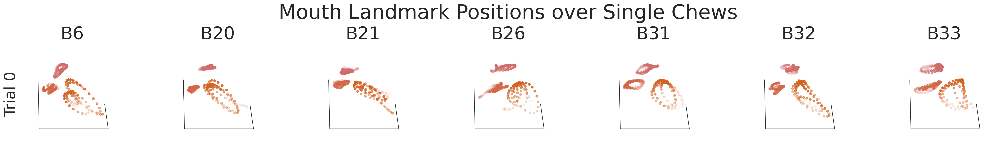

In [9]:
single_chew = {mouse: {name: np.expand_dims(m[slice(*molar_chew_times[mouse][1])],
                                            axis=0)
                       for name, m in measures.items()}
               for mouse, measures in base_3d_data.items()}

fig, axs = plot_3d_trials(single_chew,
                          landmark_selection=["lowerlip",
                                              "upperlip(left)",
                                              "upperlip(right)"],
                          view_init=(-20, 180, 180),
                          col_label_size=35,
                          row_label_size=30)
fig.suptitle("Mouth Landmark Positions over Single Chews", fontsize=40)

## Panel b

Define a helper function for plotting mouth 3D triangle over time.

In [10]:
def plot_mouth_triangle(data,
                        landmark_selection = None,
                        time_window = None,
                        view_init = None,
                        col_label_size = "x-large",
                        row_label_pad = 5,
                        row_label_size = "large"):

    landmark_selection = maybe(landmark_selection,
                               list(next(iter(data.values())).keys()))
    nmice = len(data)
    ntrials = 10
    t_start, t_end, dt = time_window

    offset = 3
    color_test = ['k', 'g', 'r']
    fig, axs = plt.subplots(nrows=ntrials,
                            ncols=nmice,
                            subplot_kw={"projection": "3d"},
                            figsize=(4*nmice, 8*ntrials),
                            dpi=200,
                            constrained_layout=False)

    for j, (mouse, landmarks) in enumerate(data.items()):
        for i in range(ntrials):
            ax = axs[i, j] if ntrials > 1 else axs[j]
            if i == 0:
                ax.set_title(mouse, fontsize=col_label_size)
            # if this mouse does not have enough trials, hide the subplot
            if i >= landmarks[landmark_selection[0]].shape[0]:
                ax.axis("off")
            else:
                for p in np.arange(t_start, t_end, dt):
                    p_offset = offset * p
                    # +1 to close the triangle; 3 for x,y,z
                    landmark_lines = np.zeros([len(landmark_selection) + 1, 3])
                    for n, landmark in enumerate(landmark_selection):
                        points = landmarks[landmark]
                        alphas = 1 #np.linspace(0, 1, points.shape[1])
                        ax.scatter(points[i, p, 0],
                                   points[i, p, 1],
                                   points[i, p, 2] - p_offset,
                                   color=LANDMARK_CMAP[landmark],
                                   alpha=alphas)
                        landmark_lines[n, :] = points[i, p, :]
                    landmark_lines[n + 1, :] = landmark_lines[0, :]
                    ax.plot(landmark_lines[:, 0],
                            landmark_lines[:, 1],
                            landmark_lines[:, 2] - p_offset,
                            color=LANDMARK_CMAP[landmark],
                            alpha=alphas * 0.5)
                if view_init is not None:
                    ax.view_init(*view_init)
                trim_3d_axes(ax)
                ax.axis('off')
            if j == 0:
                ax.annotate(f"Trial {i}",
                            xy=(0, 0.5),
                            xytext=(-row_label_pad, 0),
                            xycoords="axes fraction",
                            textcoords="offset points",
                            size=row_label_size,
                            ha="right",
                            va="center",
                            rotation="vertical")

    return fig, axs

In [11]:
fig, axs = plot_mouth_triangle(base_3d_landmarks,
                          landmark_selection=["lowerlip",
                                              "upperlip(left)",
                                              "upperlip(right)"],
                          time_window = (0, 50, 1),
                        #   time_window = (2950, 3000, 1),
                          view_init=(40, 180, 90),
                        #   view_init=(0, -90, 0), # XZ plane
                          col_label_size=35,
                          row_label_size=30)
fig.suptitle("Mouth Landmark Positions over Chew Trials", fontsize=40)
fig.tight_layout()

## Panel c

Define a helper function to compute transition time, mouth area envelope, etc.

In [12]:
def compute_envelope(signal, window = 20, lower = False):
    if lower:
        peaks = sp.signal.find_peaks(-signal, distance=window)[0]
    else:
        peaks = sp.signal.find_peaks(signal, distance=window)[0]

    # linearly interpolate the envelope
    envelope = np.interp(np.arange(len(signal)), peaks, signal[peaks])
    # median filter envelope
    envelope = sp.signal.medfilt(envelope, 149)

    return envelope

def compute_cumauc(envelope):
    floor = np.min(envelope)
    cumauc = sp.integrate.cumulative_trapezoid(envelope - floor, initial=0)

    return cumauc / cumauc[-1]

def compute_transition_time(cumauc):
    kneedle = kneed.KneeLocator(np.arange(len(cumauc)), cumauc,
                                curve="concave",
                                direction="increasing")

    return kneedle.knee

mouth_area_envelopes = {
    side: {
        mouse: {trial: np.expand_dims(compute_envelope(area[0],
                                                       lower=(side == "lower")), 0)
                for trial, area in areas.items()}
        for mouse, areas in mouth_area.items()
    }
    for side in ("upper", "lower")
}
mouth_area_envauc = {
    side: {
        mouse: {trial: np.expand_dims(compute_cumauc(envelope[0]), 0)
                for trial, envelope in envelopes.items()}
        for mouse, envelopes in area_envelopes.items()
    }
    for side, area_envelopes in mouth_area_envelopes.items()
}
mouth_area_transition = {
    side: {
        mouse: {trial: compute_transition_time(cumauc[0])
                for trial, cumauc in cumaucs.items()}
        for mouse, cumaucs in envauc.items()
    }
    for side, envauc in mouth_area_envauc.items()
}

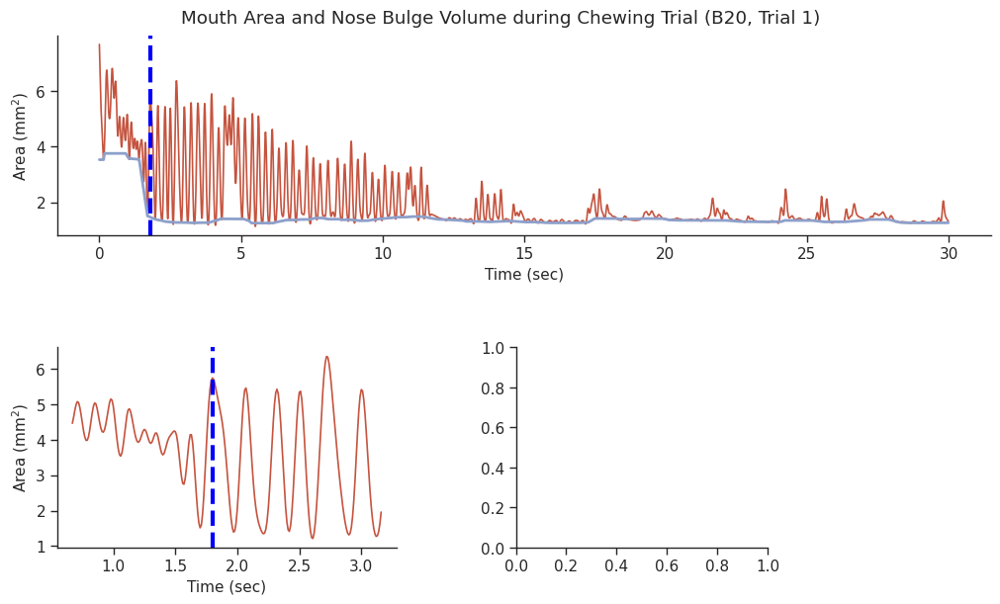

In [14]:
fig = plt.figure(figsize=(10, 6), layout="constrained")
axs = fig.subplot_mosaic([["full", "full", "full", "full"],
                          ["incisor", ".", "molar", "."]],
                         gridspec_kw={"hspace": 0.2},
                        #  sharey=True,
                         width_ratios=[2.7, 0.0, 2, 1.3])

plot_trialized_helper(mouth_area["B20"]["Trial 1"], axs["full"],
                      color=MEASUREMENT_CMAP["mouth-area"])
axs["full"].set_ylabel("Area (mm$^2$)")
axs["full"].set_xlabel("Time (sec)")

axs["full"].axvline(mouth_area_transition["lower"]["B20"]["Trial 1"] / 100,
                    linestyle="dashed", linewidth=3, color="blue")
# axs["full"].annotate("ingestion $\\to$ mastication transition time",
#                      xy=(mouth_area_transition["lower"]["B20"]["Trial 1"] / 100, 7),
#                      xytext=(7.5, 0),
#                      textcoords="offset points",
#                      color="blue")

plot_trialized_helper(mouth_area_envelopes["lower"]["B20"]["Trial 1"], axs["full"],
                      linewidth=2, color=sns.color_palette()[2])

trial_start = base_trials["B20"][molar_chew_times["B20"][0]][0]

ts = np.arange(*(9817, 10067)) - trial_start
sns.lineplot(x=ts / 100, y=mouth_area["B20"]["Trial 1"][0, ts],
             color=MEASUREMENT_CMAP["mouth-area"], ax=axs["incisor"])
axs["incisor"].set_ylabel("Area (mm$^2$)")
axs["incisor"].set_xlabel("Time (sec)")

axs["incisor"].axvline(mouth_area_transition["lower"]["B20"]["Trial 1"] / 100,
                       linestyle="dashed", linewidth=3, color="blue")

# ts = np.arange(*molar_chew_times["B20"][1]) - trial_start
# sns.lineplot(x=ts / 100, y=mouth_area["B20"]["Trial 1"][0, ts],
#              color=MEASUREMENTS_CMAP["mouth-area"], ax=axs["molar"])
# axs["molar"].set_ylabel("Area (mm$^2$)")
# axs["molar"].set_xlabel("Time (sec)")

sns.despine(fig)
fig.suptitle("Mouth Area and Nose Bulge Volume during Chewing Trial (B20, Trial 1)")
save_figure(OUTPUT_DIR, "chewing_panel_c_exemplar_a", fig)

## Panel d

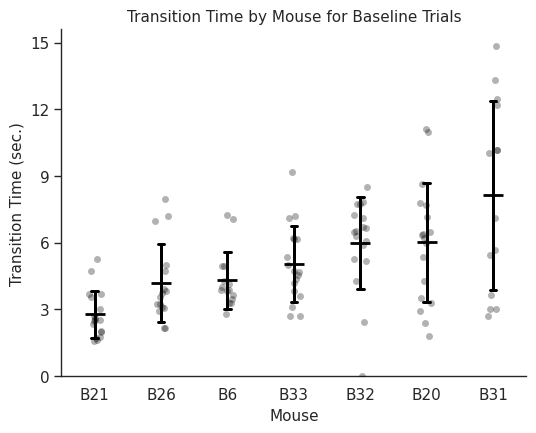

In [15]:
fig, ax = plt.subplots(figsize=(6, 4.5))
ax.yaxis.set_major_locator(ticker.MaxNLocator(6))
sorted_transitions = dict(sorted(mouth_area_transition["lower"].items(),
                                 key=lambda kv: np.mean(list(kv[1].values()))))
xs = np.concatenate([np.repeat(mouse, ntrials[mouse])
                     for mouse in sorted_transitions.keys()], axis=0)
ys = np.concatenate([np.array([t / 100 for t in transitions.values()])
                     for transitions in sorted_transitions.values()], axis=0)
sns.stripplot(x=xs, y=ys, color="black", alpha=0.3, ax=ax)
sns.pointplot(x=xs, y=ys,
              color="black",
              linestyle="none",
              marker="_", markersize=15, markeredgewidth=2,
              capsize=0.1,
              errorbar=(lambda x: (x.mean() - x.std(ddof=1), x.mean() + x.std(ddof=1))),
              ax=ax)
ax.set_xlabel("Mouse")
ax.set_ylabel("Transition Time (sec.)")
ax.set_title("Transition Time by Mouse for Baseline Trials")
ax.tick_params(axis="x", bottom=False)
ax.set_ylim(0, None)
sns.despine(fig)
save_figure(OUTPUT_DIR, "chewing_panel_d_transition_time_summary", fig)

## Panel e

Normalize mouth area and nose bulge for plotting together.

In [16]:
def standardize(x):
    m = np.mean(x, axis=-1, keepdims=True)
    s = np.std(x, axis=-1, keepdims=True)

    return (x - m) / s

mouth_area_norm = {mouse: {trial: standardize(area)
                           for trial, area in areas.items()}
                   for mouse, areas in mouth_area_filt.items()}
nose_bulge_norm = {mouse: {trial: standardize(volume)
                           for trial, volume in volumes.items()}
                   for mouse, volumes in nose_bulge_filt.items()}
cheek_bulge_norm = {mouse: {trial: standardize(volume)
                            for trial, volume in volumes.items()}
                    for mouse, volumes in cheek_bulge_filt.items()}

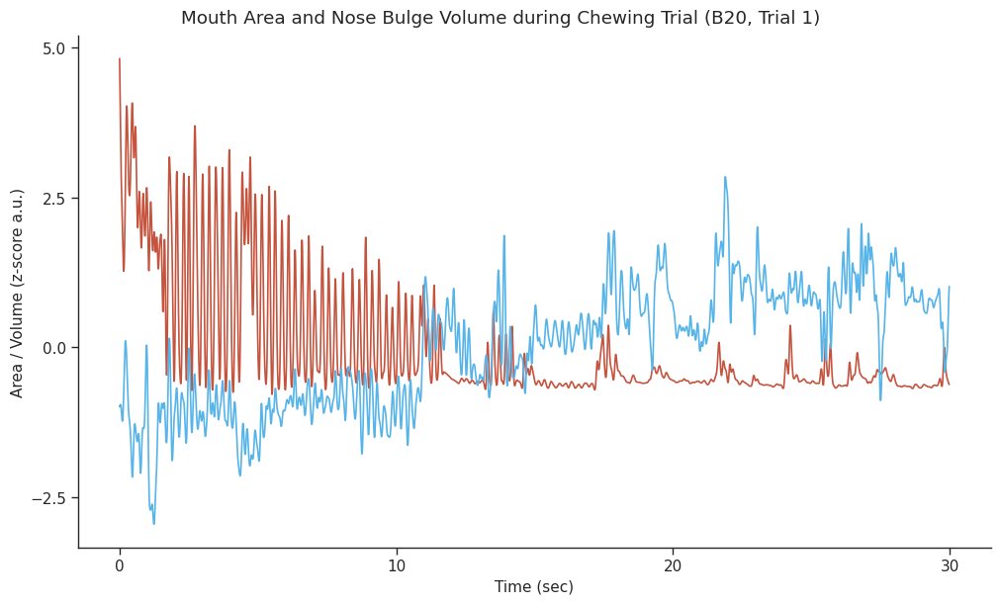

In [17]:
fig = plt.figure(figsize=(10, 6), layout="constrained")
axs = fig.subplots()
axs.xaxis.set_major_locator(ticker.MaxNLocator(4))
axs.yaxis.set_major_locator(ticker.MaxNLocator(4))

plot_trialized_helper(standardize(mouth_area["B20"]["Trial 1"]), axs,
                      color=MEASUREMENT_CMAP["mouth-area"])

plot_trialized_helper(standardize(nose_bulge["B20"]["Trial 1"]), axs,
                      color=MEASUREMENT_CMAP["nose-bulge-volume"])

axs.set_ylabel("Area / Volume (z-score a.u.)")
axs.set_xlabel("Time (sec)")

# axs.axvline(mouth_area_transition["lower"]["B20"]["Trial 1"] / 100,
#             linestyle="dashed", linewidth=3, color="blue")
# axs["full"].annotate("ingestion $\\to$ mastication transition time",
#                      xy=(mouth_area_transition["lower"]["B20"]["Trial 1"] / 100, 7),
#                      xytext=(7.5, 0),
#                      textcoords="offset points",
#                      color="blue")

sns.despine(fig)
fig.suptitle("Mouth Area and Nose Bulge Volume during Chewing Trial (B20, Trial 1)")
save_figure(OUTPUT_DIR, "chewing_panel_e_mouth_nose_bulge", fig)

## Panel f

In [18]:
def compute_mouth_nose_correlation(mouth_areas, nose_bulge_volumes):
    # concatenate all trials together
    mouth_area = np.concatenate([standardize(area)
                                 for area in mouth_areas.values()], axis=-1)
    nose_volume = np.concatenate([standardize(vol)
                                  for vol in nose_bulge_volumes.values()], axis=-1)

    # correlate over the everything independent of time trial
    line = sp.stats.linregress(mouth_area[0], nose_volume[0], alternative="less")

    return {"x": mouth_area[0], "y": nose_volume[0], "line": line}

mouth_nose_corr = {mouse: compute_mouth_nose_correlation(mouths, noses)
                   for (mouse, mouths), noses in zip(mouth_area.items(),
                                                     nose_bulge.values())}
mouth_nose_corr_labels = {
    mouse: np.concatenate([np.repeat(["Ingestion", "Mastication"], [t, 3000 - t])
                           for t in transitions.values()], axis=0)
    for mouse, transitions in mouth_area_transition["lower"].items()
}

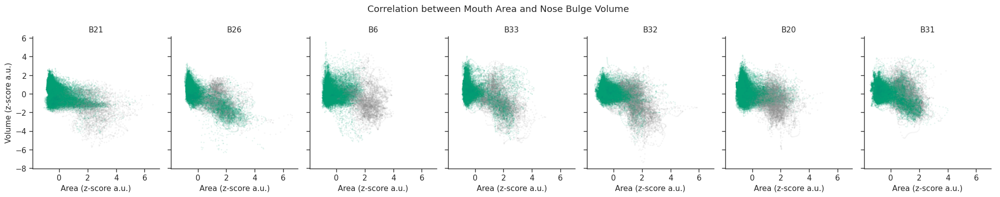

In [19]:
def pvalue_to_asterisk(pvalue):
    if pvalue > 0.05:
        return "ns"
    elif pvalue > 0.01:
        return "*"
    else:
        return "*" * int(min(4, -np.floor(np.log10(pvalue))))

def plot_mouth_nose_helper(data, labels, ax):
    sns.scatterplot(x=data["x"], y=data["y"], hue=labels,
                    hue_order=["Mastication", "Ingestion"],
                    palette=CONTROL_CMAP[:2],
                    edgecolors="none",
                    alpha=0.1,
                    s=4,
                    legend=False,
                    ax=ax)
    # xs = np.linspace(np.min(data["x"]), np.max(data["x"]), 100)
    # ys = data["line"].slope * xs + data["line"].intercept
    # sns.lineplot(x=xs, y=ys,
    #              linestyle="dashed",
    #              linewidth=2,
    #              color="black",
    #              ax=ax)
    # ax.text(x=np.median(data["x"]), y=np.max(data["y"]) + 0.5,
    #         s=f"r$^2$ = {data['line'].rvalue ** 2} ({pvalue_to_asterisk(data['line'].pvalue)})",
    #         horizontalalignment="center")

fig, axs = plt.subplots(ncols=len(mouth_nose_corr), sharex=True, sharey=True, figsize=(20, 4))
sorted_mouth_nose_corrs = dict(
    sorted(mouth_nose_corr.items(),
           key=lambda kv: np.mean(list(mouth_area_transition["lower"][kv[0]].values())))
)
for i, (mouse, data) in enumerate(sorted_mouth_nose_corrs.items()):
    plot_mouth_nose_helper(data, mouth_nose_corr_labels[mouse], axs[i])
    axs[i].set_title(mouse)
    axs[i].set_xlabel("Area (z-score a.u.)")
axs[0].set_ylabel("Volume (z-score a.u.)")

fig.legend(*axs[-1].get_legend_handles_labels(),
           loc='upper right', ncols=2, frameon=False)

fig.suptitle("Correlation between Mouth Area and Nose Bulge Volume")
sns.despine(fig)
fig.tight_layout()
save_figure(OUTPUT_DIR, "chewing_panel_f_mouth_nose_correlation", fig)

## Panel H

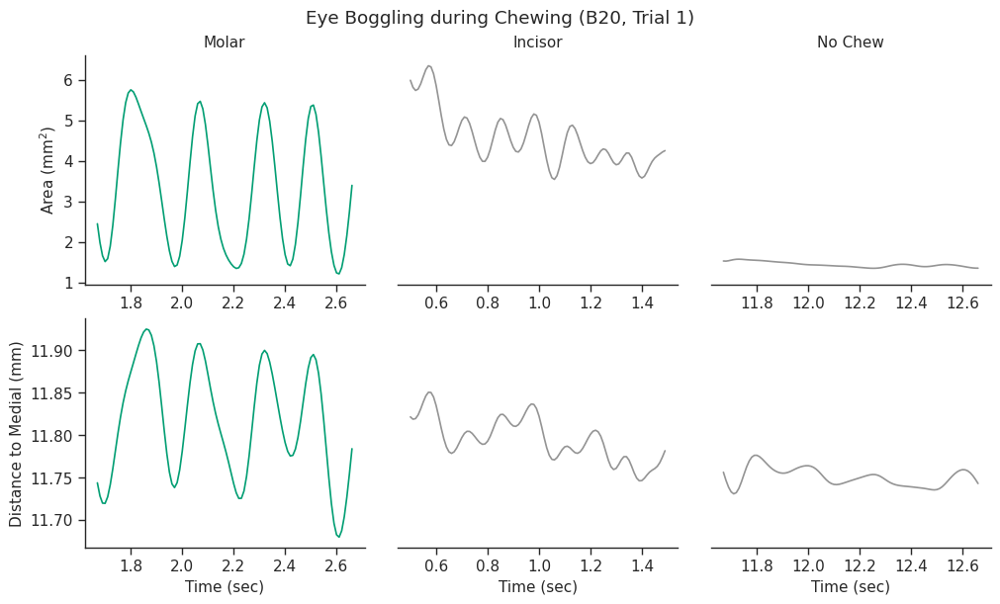

In [20]:
fig = plt.figure(figsize=(10, 6), layout="constrained")
mosaic = [["mouth_molar", "mouth_incisor", "mouth_nochew"],
          ["eye_molar", "eye_incisor", "eye_nochew"]]
axs = fig.subplot_mosaic(mosaic, gridspec_kw={"wspace": 0.1})

for row in mosaic:
    for col in row[1:]:
        axs[col].sharey(axs[row[0]])

trial_start = base_trials["B20"][1][0]

ts = np.arange(*molar_chew_times["B20"][1]) - trial_start
sns.lineplot(x=ts / 100, y=mouth_area["B20"]["Trial 1"][0, ts],
             color=CONTROL_CMAP[0], ax=axs["mouth_molar"])
axs["mouth_molar"].set_title("Molar")
axs["mouth_molar"].set_ylabel("Area (mm$^2$)")
sns.lineplot(x=ts / 100, y=eye_z_proj["left"]["B20"]["Trial 1"][0, ts],
             color=CONTROL_CMAP[0], ax=axs["eye_molar"])
axs["eye_molar"].set_xlabel("Time (sec)")
axs["eye_molar"].set_ylabel("Distance to Medial (mm)")

ts = np.arange(*incisor_chew_times["B20"][1]) - trial_start
sns.lineplot(x=ts / 100, y=mouth_area["B20"]["Trial 1"][0, ts],
             color=CONTROL_CMAP[1], ax=axs["mouth_incisor"])
axs["mouth_incisor"].set_title("Incisor")
sns.lineplot(x=ts / 100, y=eye_z_proj["left"]["B20"]["Trial 1"][0, ts],
             color=CONTROL_CMAP[1], ax=axs["eye_incisor"])
axs["eye_incisor"].set_xlabel("Time (sec)")

ts = np.arange(*nochew_times["B20"][1]) - trial_start
sns.lineplot(x=ts / 100, y=mouth_area["B20"]["Trial 1"][0, ts],
             color=CONTROL_CMAP[1], ax=axs["mouth_nochew"])
axs["mouth_nochew"].set_title("No Chew")
sns.lineplot(x=ts / 100, y=eye_z_proj["left"]["B20"]["Trial 1"][0, ts],
             color=CONTROL_CMAP[1], ax=axs["eye_nochew"])
axs["eye_nochew"].set_xlabel("Time (sec)")

sns.despine(fig)
for row in mosaic:
    for col in row[1:]:
        sns.despine(ax=axs[col], left=True)
        axs[col].tick_params("y", left=False, labelleft=False)
fig.suptitle("Eye Boggling during Chewing (B20, Trial 1)")
save_figure(OUTPUT_DIR, "chewing_panel_h_boggling_exemplar", fig)

## Panel i

Compute cross-correlation between eye and mouth measurements.

In [21]:
def compute_boggling_corr(mouth_area, eye_proj):
    # use temporal differencing to remove trends
    mouth_diff = np.diff(mouth_area)
    eye_diff = np.diff(eye_proj)
    # cross correlate the signals
    corr = np.correlate(mouth_diff, eye_diff, mode="same")

    return corr

boggling_corr = {
    mouse: {
        trial: {
            "pre": compute_boggling_corr(
                standardize(area)[0, :mouth_area_transition["lower"][mouse][trial]],
                standardize(proj)[0, :mouth_area_transition["lower"][mouse][trial]]
            ),
            "post": compute_boggling_corr(
                standardize(area)[0, mouth_area_transition["lower"][mouse][trial]:],
                standardize(proj)[0, mouth_area_transition["lower"][mouse][trial]:]
            )
        }
        for (trial, area), proj in zip(mouth_areas.items(),
                                       eye_projs.values())
        if mouth_area_transition["lower"][mouse][trial] != 0
        }
    for (mouse, mouth_areas), eye_projs in zip(mouth_area.items(),
                                               eye_z_proj["left"].values())
}

In [22]:
Tmin = np.min([np.min([np.minimum(len(corr["pre"]), len(corr["post"]))
                       for corr in corrs.values()])
               for corrs in boggling_corr.values()])

def select_middle_slice(data, window):
    mid = data.shape[0] // 2

    return data[(mid - window // 2):(mid + window // 2)]

boggling_corr_tmin = {mouse: {trial: {phase: select_middle_slice(data, Tmin)
                                      for phase, data in corr.items()}
                              for trial, corr in corrs.items()}
                      for mouse, corrs in boggling_corr.items()}

In [23]:
def get_max_corr(corr):
    peak_range = select_middle_slice(corr, 10)

    return peak_range[np.argmax(np.abs(peak_range))]

def get_max_corr_lag(corr):
    peak_range = select_middle_slice(corr, 10)

    return np.argmax(np.abs(peak_range)) - 5

boggline_peak_corr = {mouse: {phase: np.array([get_max_corr(corr[phase])
                                               for corr in corrs.values()])
                              for phase in ("pre", "post")}
                      for mouse, corrs in boggling_corr_tmin.items()}

boggline_peak_lag = {mouse: {phase: np.array([get_max_corr_lag(corr[phase])
                                              for corr in corrs.values()])
                             for phase in ("pre", "post")}
                     for mouse, corrs in boggling_corr_tmin.items()}

for mouse in boggline_peak_corr.keys():
    for phase in ("pre", "post"):
        print(mouse, phase)
        print("Mean peak corr =", boggline_peak_corr[mouse][phase].mean())
        print("Std peak corr =", boggline_peak_corr[mouse][phase].std(ddof=1))
        print("Mean peak lag =", (boggline_peak_lag[mouse][phase] / 100).mean())
        print("Std peak lag =", (boggline_peak_lag[mouse][phase] / 100).std(ddof=1))
        print()

B6 pre
Mean peak corr = 0.7873082563976335
Std peak corr = 2.670586561882589
Mean peak lag = -0.0033333333333333335
Std peak lag = 0.02794552524023088

B6 post
Mean peak corr = 48.921259662037514
Std peak corr = 15.226119820929338
Mean peak lag = 0.0006666666666666666
Std peak lag = 0.0025819888974716117

B20 pre
Mean peak corr = 3.994516554975527
Std peak corr = 3.0852443673368377
Mean peak lag = -0.0027777777777777788
Std peak lag = 0.019343810548491932

B20 post
Mean peak corr = 51.42433734038756
Std peak corr = 21.805222073629547
Mean peak lag = -0.0033333333333333335
Std peak lag = 0.008401680504168058

B21 pre
Mean peak corr = 8.034377294418963
Std peak corr = 5.011759594186452
Mean peak lag = -0.0022222222222222222
Std peak lag = 0.0064676166676355465

B21 post
Mean peak corr = 61.24531744616171
Std peak corr = 20.61703307005108
Mean peak lag = 0.0
Std peak lag = 0.0

B26 pre
Mean peak corr = -0.8497480719070029
Std peak corr = 1.1993061666686393
Mean peak lag = -0.016875
Std pe

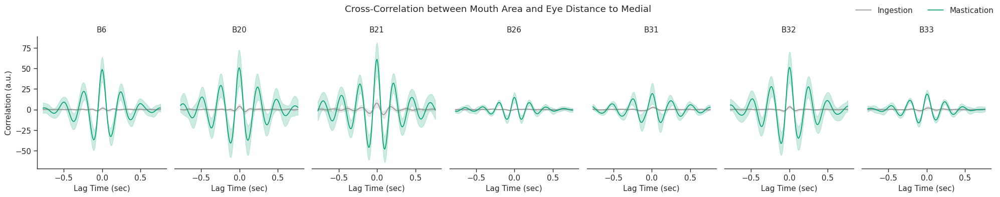

In [24]:
fig, axs = plt.subplots(ncols=len(boggling_corr_tmin),
                        sharex=True, sharey=True, figsize=(20, 4))

for i, (mouse, corrs) in enumerate(boggling_corr_tmin.items()):
    for phase in ("pre", "post"):
        ts = np.concatenate([np.arange(-data[phase].shape[0] // 2,
                                       data[phase].shape[0] // 2) / 100
                             for data in corrs.values()], axis=0)
        ys = np.concatenate([data[phase] for data in corrs.values()], axis=0)
        sns.lineplot(x=ts, y=ys,
                     errorbar="sd",
                     label=("Ingestion" if phase == "pre" else "Mastication"),
                     legend=False,
                     color=(CONTROL_CMAP[0] if phase == "post"
                            else CONTROL_CMAP[1]),
                     ax=axs[i])
    axs[i].set_title(mouse)
    axs[i].set_xlabel("Lag Time (sec)")
axs[0].set_ylabel("Correlation (a.u.)")

# for i, (mouse, stat) in enumerate(boggline_corr_ttest.items()):
#     axs[i].text(x=0, y=55, s=pvalue_to_asterisk(stat.pvalue),
#                 horizontalalignment="center")
    # axs[i].set_ylim(None, 4)

sns.despine(fig)
for ax in axs[1:]:
    sns.despine(ax=ax, left=True)
    ax.tick_params(axis="y", left=False)
fig.legend(*axs[-1].get_legend_handles_labels(),
           loc='upper right', ncols=2, frameon=False)
fig.suptitle("Cross-Correlation between Mouth Area and Eye Distance to Medial")
fig.tight_layout()
save_figure(OUTPUT_DIR, "chewing_panel_i_boggling_corr_curves", fig)

### Stats

In [25]:
boggline_corr_ttest = {mouse: sp.stats.ttest_rel(corrs["post"], corrs["pre"],
                                                 alternative="greater")
                       for mouse, corrs in boggline_peak_corr.items()}
for mouse, test in boggline_corr_ttest.items():
    print(mouse)
    print("Significance = ", test.pvalue)
    print()

B6
Significance =  3.849217125686841e-09

B20
Significance =  1.3159122205611813e-08

B21
Significance =  3.633685676117069e-10

B26
Significance =  4.898150562807396e-08

B31
Significance =  0.0002260005622252848

B32
Significance =  7.729168423166465e-09

B33
Significance =  1.547051754480717e-10



In [26]:
pre_corrs = np.array([np.mean(corrs["pre"])
                      for corrs in boggline_peak_corr.values()])
post_corrs = np.array([np.mean(corrs["post"])
                       for corrs in boggline_peak_corr.values()])
sp.stats.ttest_rel(post_corrs, pre_corrs, alternative="greater")

TtestResult(statistic=5.289341765325454, pvalue=0.0009242955074474644, df=6)

In [27]:
boggline_corr_ttest = {mouse: sp.stats.wilcoxon(corrs["post"], corrs["pre"],
                                                 alternative="greater")
                       for mouse, corrs in boggline_peak_corr.items()}
for mouse, test in boggline_corr_ttest.items():
    print(mouse)
    print("Significance = ", test.pvalue)
    print()

B6
Significance =  3.0517578125e-05

B20
Significance =  3.814697265625e-06

B21
Significance =  3.814697265625e-06

B26
Significance =  3.0517578125e-05

B31
Significance =  6.103515625e-05

B32
Significance =  7.62939453125e-06

B33
Significance =  3.814697265625e-06



In [28]:
pre_corrs = np.array([np.mean(corrs["pre"])
                      for corrs in boggline_peak_corr.values()])
post_corrs = np.array([np.mean(corrs["post"])
                       for corrs in boggline_peak_corr.values()])
sp.stats.wilcoxon(post_corrs, pre_corrs, alternative="greater")

WilcoxonResult(statistic=28.0, pvalue=0.0078125)

## Panel j

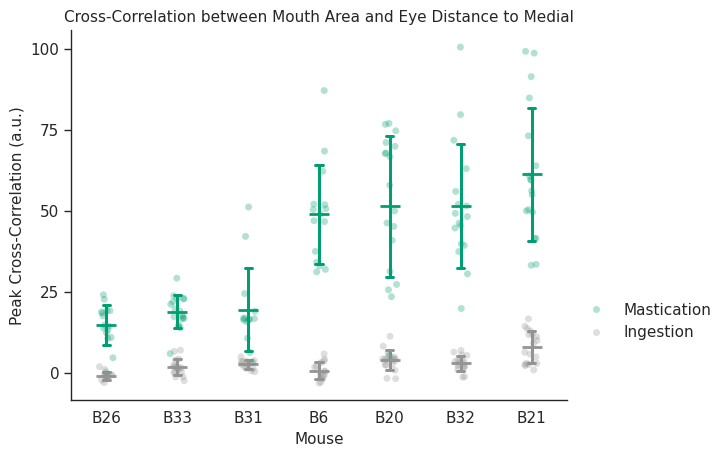

In [29]:
fig, ax = plt.subplots()
ax.yaxis.set_major_locator(ticker.MaxNLocator(5))
sorted_corrs = dict(sorted(boggline_peak_corr.items(),
                           key=lambda kv: np.mean(kv[1]["post"])))
xs = np.concatenate([np.repeat(mouse, 2 * len(corrs["post"]))
                     for mouse, corrs in sorted_corrs.items()], axis=0)
ys = np.concatenate([np.concatenate([corrs["post"], corrs["pre"]], axis=0)
                     for corrs in sorted_corrs.values()], axis=0)
hues = np.concatenate([np.repeat(["Mastication", "Ingestion"],
                                 len(corrs["post"]))
                       for corrs in sorted_corrs.values()], axis=0)

sns.stripplot(x=xs, y=ys, hue=hues,
              palette=CONTROL_CMAP[:2],
              alpha=0.3,
              ax=ax)
sns.pointplot(x=xs, y=ys, hue=hues,
              palette=CONTROL_CMAP[:2],
              linestyle="none",
              marker="_", markersize=15, markeredgewidth=2,
              capsize=0.1,
              errorbar=(lambda x: (x.mean() - x.std(ddof=1), x.mean() + x.std(ddof=1))),
              legend=False,
              ax=ax)

# for mouse, stat in boggline_corr_ttest.items():
#     ax.text(x=mouse, y=1, s=pvalue_to_asterisk(stat.pvalue),
#             horizontalalignment="center")

ax.set_xlabel("Mouse")
ax.set_ylabel("Peak Cross-Correlation (a.u.)")
ax.legend(frameon=False, bbox_to_anchor=(1.0, 0.3))
ax.set_title("Cross-Correlation between Mouth Area and Eye Distance to Medial")
ax.tick_params(axis="x", bottom=False)
sns.despine(fig)
save_figure(OUTPUT_DIR, "chewing_panel_j_boggling_summary", fig)

## Panel k

/tmp/ipykernel_5449/2467261007.py:31: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(frameon=False)


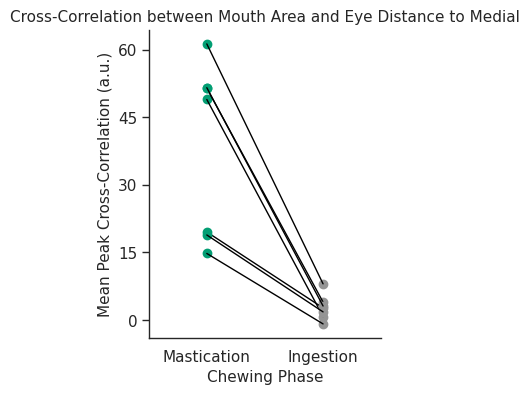

In [30]:
fig, ax = plt.subplots(figsize=(3, 4))
ax.yaxis.set_major_locator(ticker.MaxNLocator(5))

for mouse, corrs in boggline_peak_corr.items():
    xs = np.repeat(["Mastication", "Ingestion"], len(corrs["post"]))
    ys = np.concatenate([corrs["post"], corrs["pre"]], axis=0)

    # sns.stripplot(x=xs, y=ys, hue=xs, palette=CONTROL_CMAP[:2], alpha=0.3, ax=ax)
    sns.pointplot(x=xs, y=ys, hue=xs,
                  palette=CONTROL_CMAP[:2],
                  linestyle="none",
                #   marker="_", markersize=15, markeredgewidth=2,
                  capsize=0.025,
                #   errorbar=(lambda x: (x.mean() - x.std(ddof=1), x.mean() + x.std(ddof=1))),
                  errorbar=None,
                  legend=False,
                  ax=ax)
    sns.lineplot(x=xs, y=ys,
                 errorbar=None,
                 linewidth=1,
                #  linestyle="dashed",
                 color="black",
                 ax=ax)

# for mouse, stat in boggline_corr_ttest.items():
#     ax.text(x=mouse, y=1, s=pvalue_to_asterisk(stat.pvalue),
#             horizontalalignment="center")

ax.set_xlabel("Chewing Phase")
ax.set_ylabel("Mean Peak Cross-Correlation (a.u.)")
ax.legend(frameon=False)
ax.set_title("Cross-Correlation between Mouth Area and Eye Distance to Medial")
ax.tick_params(axis="x", bottom=False)
ax.set_xlim(-0.5, 1.5)
sns.despine(fig)
save_figure(OUTPUT_DIR, "chewing_panel_k_boggling_summary_summary", fig)